# Daily rainfall over central Madagascar

#### Context

Rainfall over central Madagascar from Station rain gauge dataset and ENACT dataset are compared
Central Madagascar are limited by -19.98/-20.56 latiutudes and 45.75/48 longitudes extracted by ENACT dataset (map below).
Station position are on the map, in red color.

#### Data and methodology

* Rainfall: Rainfall data are from : 
    1) Station rain gauge
    2) ENACT dataset, available on http://map.meteomadagascar.mg/maproom/Climatology/index.html?Set-Language=fr#tabs-2
* Zonal and meridional wind at 850 hPa, MSLP and Skin temperature: are from NCEP-NCAR Reanalysis 1 data provided by the NOAA PSL, Boulder, Colorado, USA, from their website at https://psl.noaa.gov
* SST are from ERSST version 5 available in IRI-DL on https://iridl.ldeo.columbia.edu/SOURCES/.NOAA/.NCDC/.ERSST/.version5/.sst/



### Madagascar country

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


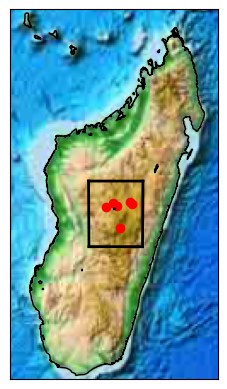

In [133]:
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
from matplotlib.patches import Polygon
# setup Lambert Conformal basemap.
# set resolution=None to skip processing of boundary datasets.
m = Basemap(projection='lcc', width=900000, height=1600000,resolution='h', lat_1=-11,lat_2=-27.5,lat_0=-18.5,lon_0=46.8)
m.etopo()
#m.colorbar()
m.drawcoastlines()
st = pd.read_csv('coord_stn_central_mdg.csv', header=0)
m.scatter(st.LON, st.LAT, latlon=True, color='r')

lo1 = 45.75
lo2 = 48.00
la1 = -20.56
la2 = -17.98
m.drawgreatcircle(lo1, la1, lo1, la2,linewidth=2,color='k')
m.drawgreatcircle(lo1, la2, lo2, la2,linewidth=2,color='k')
m.drawgreatcircle(lo2, la2, lo2, la1,linewidth=2,color='k')
m.drawgreatcircle(lo2, la1, lo1, la1,linewidth=2,color='k') 
plt.savefig('Madagascar_central_stn_box.pdf', format='pdf')
plt.show()


## Daily rainfall over central Madagascar

In [28]:
# Rainfall over central Madagascar from Station rain gauge dataset and ENACT dataset are compared

# Import library
import pandas as pd
import numpy as np
import openpyxl
import matplotlib.pyplot as plt

# Read daily rainfall data
rr = pd.read_excel('RR_central_mdg_for_SOS.xlsx', header=1)
rr['Date'] = pd.date_range('1981', '2022-05-31', freq='1D')
rr = rr.set_index('Date')
rr.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15126 entries, 1981-01-01 to 2022-05-31
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ENACT   15103 non-null  float64
 1   STN     15126 non-null  float64
dtypes: float64(2)
memory usage: 354.5 KB


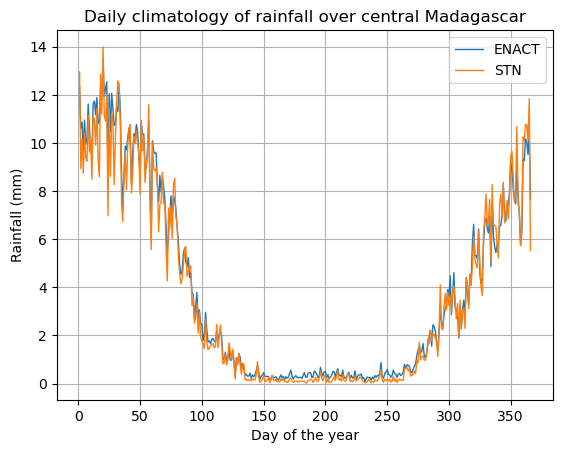

In [29]:
# Daily rainfall climatology over central Madagascar
# Use rr data
clim_day = rr.groupby(rr.index.dayofyear).mean()
'''
clim_day2 = rr.groupby([rr.index.month, rr.index.day]).mean()
clim_day22 = clim_day2[zip(rr.index.month, rr.index.day)]
clim_day22.index = rr.index
clim_day2.plot()
'''
clim_day.plot(linewidth=1)
plt.title('Daily climatology of rainfall over central Madagascar')
plt.xlabel('Day of the year')
plt.ylabel('Rainfall (mm)')
plt.grid()
plt.savefig('Daily_climatology_of_rainfall.pdf', format='pdf')
plt.show()

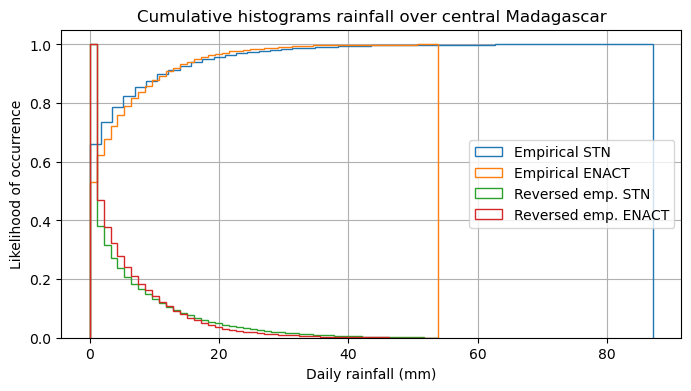

In [30]:
# Plot cumulative histogram
fig, ax = plt.subplots(figsize=(8,4))
n, bins, patches = ax.hist(rr.STN, 50, density=True, histtype='step', cumulative=True, label='Empirical STN')
n, bins, patches = ax.hist(rr.ENACT, 50, density=True, histtype='step', cumulative=True, label='Empirical ENACT')
ax.hist(rr.STN, bins=bins, density=True, histtype='step', cumulative=-1, label= 'Reversed emp. STN')
ax.hist(rr.ENACT, bins=bins, density=True, histtype='step', cumulative=-1, label= 'Reversed emp. ENACT')

ax.grid(True)
ax.legend(loc='right')
ax.set_title('Cumulative histograms rainfall over central Madagascar')
ax.set_xlabel('Daily rainfall (mm)')
ax.set_ylabel('Likelihood of occurrence')

plt.savefig('Cumulative_histogram_daily_rainfall.pdf', format='pdf')
plt.show()


# Analysis rainfall pentadal pattern

### Pentadal calculation

#### For station data

In [31]:
import pandas as pd
import numpy as np
#import openpyxl
import matplotlib.pyplot as plt

debut = pd.datetime(1981,1,1)
fin = pd.datetime(2022,5,31)

rr = pd.read_csv('rr_daily_central_mdg.csv', header=0)
rr['Date'] = pd.date_range('1981', '2022-05-31', freq='1D')
rr = rr.drop(['STN'], axis=1).set_index('Date')
#rr.info()

#timerange = pd.date_range(debut, fin)
#df1.index = (timerange)
'''
d = df1.index.day - np.clip((df1.index.day-1) // 5, 0, 5)*5 -1  # np.clip(nbr, start, lenght)
date = df1.index.values - np.array(d, dtype= "timedelta64[D]")
df2 = df1. groupby(date).sum()
df2.head(10)
'''
d = rr.index.day - np.clip((rr.index.day-1) // 5, 0, 5)*5 -1
date = rr.index.values - np.array(d, dtype = "timedelta64[D]")
df2 = rr.groupby(date).sum()
df2.head(10)


/tmp/ipykernel_10262/2549786916.py:6: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  debut = pd.datetime(1981,1,1)
/tmp/ipykernel_10262/2549786916.py:7: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  fin = pd.datetime(2022,5,31)


,37022_ANTSIRABE_AERO,34155_ANTANANARIVO_DMH,34166_IVATO_AERO,36516_IFANJA,36537_ANKADINONDRY_SAKAY,36520_MIARINARIVO,STN_mean
1981-01-01,13.564,0.465,0.157,34.236,49.224,22.887,20.088833
1981-01-06,45.544,144.074,121.612,40.413,70.950,27.975,75.094667
1981-01-11,23.057,76.115,74.342,24.238,49.402,18.170,44.220667
1981-01-16,0.000,0.000,0.000,0.921,1.095,0.552,0.428000
1981-01-21,0.685,1.443,0.479,0.553,11.252,0.748,2.526667
1981-01-26,22.583,44.045,54.148,29.801,27.455,20.341,33.062167
1981-02-01,38.342,23.557,30.021,12.570,43.672,2.843,25.167500
1981-02-06,45.912,59.384,37.444,3.936,37.144,1.869,30.948167
1981-02-11,7.857,0.000,0.000,4.920,25.902,4.579,7.209667
1981-02-16,13.826,12.702,7.704,25.744,13.604,22.983,16.093833


#### For gridded dataset

In [45]:
# Need to be performed for sufficient manner, not working
nc = xr.open_dataset(r'data/pres.sfc.mon.mean.nc', decode_times = False)
nc['time'] = pd.date_range(start='1981-01-01', periods=nc.sizes['time'], freq='D') # essay with daily data from 1981-01-01
nc

<xarray.Dataset>
Dimensions:  (lat: 73, lon: 144, time: 904)
Coordinates:
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) datetime64[ns] 1981-01-01 1981-01-02 ... 1983-06-23
Data variables:
    pres     (time, lat, lon) float32 ...
Attributes:
    description:    Data is from NMC initialized reanalysis\n(4x/day).  These...
    platform:       Model
    Conventions:    COARDS
    NCO:            20121012
    history:        Thu May  4 18:12:05 2000: ncrcat -d time,0,622 /Datasets/...
    title:          monthly mean pres.sfc from the NCEP Reanalysis
    dataset_title:  NCEP-NCAR Reanalysis 1
    References:     http://www.psl.noaa.gov/data/gridded/data.ncep.reanalysis...

### Pentadal climatology of rainfall

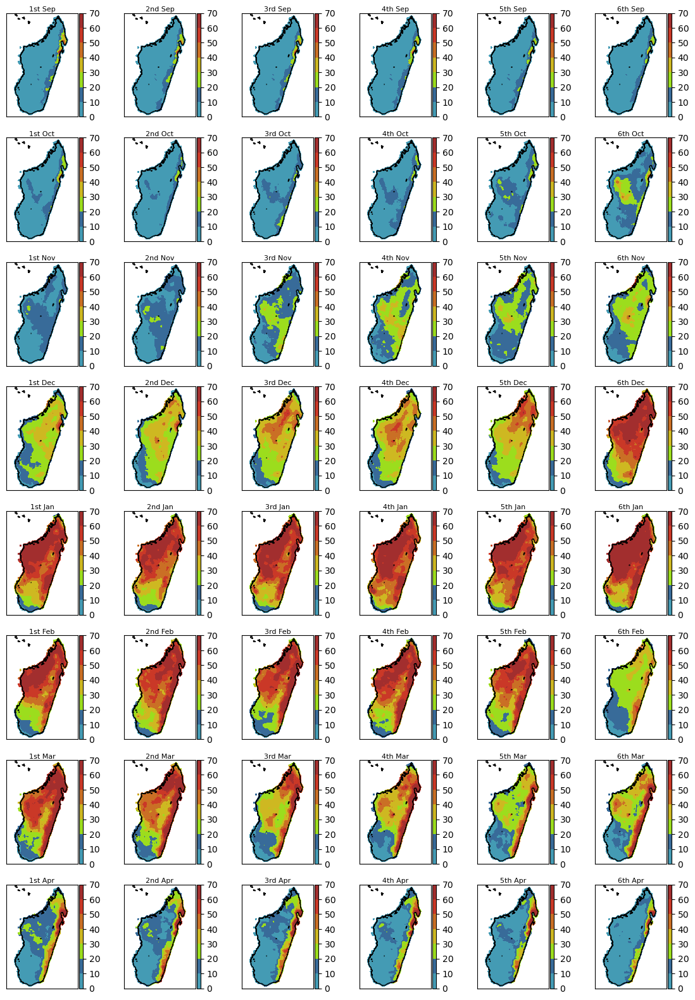

In [129]:
# Import library
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib
from mpl_toolkits.basemap import Basemap
import pandas as pd
import numpy as np

#list_of_filenames = glob.glob("data/clim_*.nc")
list_of_clim = ['data/PRECIP/clim_49.nc', 'data/PRECIP/clim_50.nc', 'data/PRECIP/clim_51.nc', 'data/PRECIP/clim_52.nc', 'data/PRECIP/clim_53.nc', 'data/PRECIP/clim_54.nc',
               'data/PRECIP/clim_55.nc', 'data/PRECIP/clim_56.nc', 'data/PRECIP/clim_57.nc', 'data/PRECIP/clim_58.nc', 'data/PRECIP/clim_59.nc', 'data/PRECIP/clim_60.nc',
               'data/PRECIP/clim_61.nc', 'data/PRECIP/clim_62.nc', 'data/PRECIP/clim_63.nc', 'data/PRECIP/clim_64.nc', 'data/PRECIP/clim_65.nc', 'data/PRECIP/clim_66.nc',
               'data/PRECIP/clim_67.nc', 'data/PRECIP/clim_68.nc', 'data/PRECIP/clim_69.nc', 'data/PRECIP/clim_70.nc', 'data/PRECIP/clim_71.nc', 'data/PRECIP/clim_72.nc',
               'data/PRECIP/clim_1.nc', 'data/PRECIP/clim_2.nc', 'data/PRECIP/clim_3.nc', 'data/PRECIP/clim_4.nc', 'data/PRECIP/clim_5.nc', 'data/PRECIP/clim_6.nc',
               'data/PRECIP/clim_7.nc', 'data/PRECIP/clim_8.nc', 'data/PRECIP/clim_9.nc', 'data/PRECIP/clim_10.nc', 'data/PRECIP/clim_11.nc', 'data/PRECIP/clim_12.nc',
               'data/PRECIP/clim_13.nc', 'data/PRECIP/clim_14.nc', 'data/PRECIP/clim_15.nc', 'data/PRECIP/clim_16.nc', 'data/PRECIP/clim_17.nc', 'data/PRECIP/clim_18.nc',
               'data/PRECIP/clim_19.nc', 'data/PRECIP/clim_20.nc', 'data/PRECIP/clim_21.nc', 'data/PRECIP/clim_22.nc', 'data/PRECIP/clim_23.nc', 'data/PRECIP/clim_24.nc',]
list_of_pentad = ['1st Sep', '2nd Sep', '3rd Sep', '4th Sep', '5th Sep', '6th Sep',
                 '1st Oct', '2nd Oct', '3rd Oct', '4th Oct', '5th Oct', '6th Oct',
                 '1st Nov', '2nd Nov', '3rd Nov', '4th Nov', '5th Nov', '6th Nov',
                 '1st Dec', '2nd Dec', '3rd Dec', '4th Dec', '5th Dec', '6th Dec',
                 '1st Jan', '2nd Jan', '3rd Jan', '4th Jan', '5th Jan', '6th Jan',
                 '1st Feb', '2nd Feb', '3rd Feb', '4th Feb', '5th Feb', '6th Feb',
                 '1st Mar', '2nd Mar', '3rd Mar', '4th Mar', '5th Mar', '6th Mar',
                 '1st Apr', '2nd Apr', '3rd Apr', '4th Apr', '5th Apr', '6th Apr',]
init = xr.open_dataset(r'data/PRECIP/clim_49.nc') # 1st septembre
init = init.rfe
lons = init['Lon'][:]
lats = init['Lat'][:]
ls = -1

m = Basemap(projection='cyl', llcrnrlon=min(lons), llcrnrlat=min(lats), urcrnrlon=max(lons), urcrnrlat=max(lats), resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires

fig, ax_list = plt.subplots(8, 6, figsize=(14,20))
for ax, fname in zip(np.ravel(ax_list), list_of_clim):
    ls = ls + 1
    m.ax = ax
    nc = xr.open_dataset(fname)
    nc = nc.rfe
    cmap = matplotlib.colors.ListedColormap(['#449bb4', '#386b99', '#9cdd1d', '#ceb821', '#ca6f25', '#ca3827', '#a22e2e'])    
    ticks = [0,10,20,30,40,50,60,70]
    #cmap = matplotlib.colors.ListedColormap(['#449bb4', '#386b99', '#9cdd1d', '#ceb821', '#ca6f25', '#ca3827', '#a22e2e','#953180','#893ec9'])    
    #ticks = [0,5,10,15,20,30,40,50,60]
    p = m.pcolormesh(lons,lats,nc,cmap=cmap,vmin=0,vmax=70)
    #cs = m.pcolormesh(lons, lats, nc, cmap='jet_r', latlon=True, vmin=0, vmax=70)
    #m.colorbar(cs,"right", size="5%", pad='6%', ticks=np.linspace(0., 70., 10))
    m.colorbar(p, ticks=ticks)
    m.drawcoastlines()
    plt.title( list_of_pentad[ls], fontsize=8, pad=2)
plt.savefig('Pentadal_rainfall_mdg.pdf', format='pdf')
plt.show() 

### Pentadal climatology of Wind component

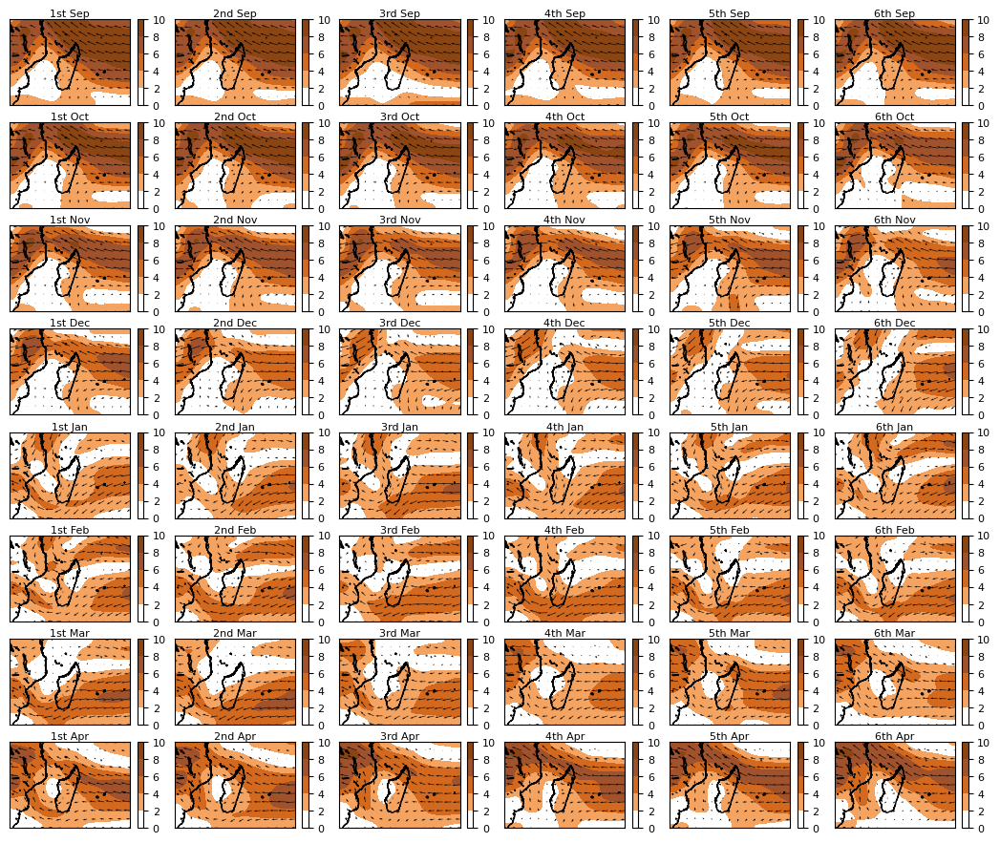

In [127]:
# Little bit tricky for wind dataset with MSLP font
# Import library
import xarray as xr
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from matplotlib.cm import get_cmap
import pandas as pd
import numpy as np

######################
#list_of_filenames = glob.glob("data/clim_*.nc")
list_of_clim = ['data/Merge/clim_49.nc', 'data/Merge/clim_50.nc', 'data/Merge/clim_51.nc', 'data/Merge/clim_52.nc', 'data/Merge/clim_53.nc', 'data/Merge/clim_54.nc',
               'data/Merge/clim_55.nc', 'data/Merge/clim_56.nc', 'data/Merge/clim_57.nc', 'data/Merge/clim_58.nc', 'data/Merge/clim_59.nc', 'data/Merge/clim_60.nc',
               'data/Merge/clim_61.nc', 'data/Merge/clim_62.nc', 'data/Merge/clim_63.nc', 'data/Merge/clim_64.nc', 'data/Merge/clim_65.nc', 'data/Merge/clim_66.nc',
               'data/Merge/clim_67.nc', 'data/Merge/clim_68.nc', 'data/Merge/clim_69.nc', 'data/Merge/clim_70.nc', 'data/Merge/clim_71.nc', 'data/Merge/clim_72.nc',
               'data/Merge/clim_1.nc', 'data/Merge/clim_2.nc', 'data/Merge/clim_3.nc', 'data/Merge/clim_4.nc', 'data/Merge/clim_5.nc', 'data/Merge/clim_6.nc',
               'data/Merge/clim_7.nc', 'data/Merge/clim_8.nc', 'data/Merge/clim_9.nc', 'data/Merge/clim_10.nc', 'data/Merge/clim_11.nc', 'data/Merge/clim_12.nc',
               'data/Merge/clim_13.nc', 'data/Merge/clim_14.nc', 'data/Merge/clim_15.nc', 'data/Merge/clim_16.nc', 'data/Merge/clim_17.nc', 'data/Merge/clim_18.nc',
               'data/Merge/clim_19.nc', 'data/Merge/clim_20.nc', 'data/Merge/clim_21.nc', 'data/Merge/clim_22.nc', 'data/Merge/clim_23.nc', 'data/Merge/clim_24.nc',]
list_of_pentad = ['1st Sep', '2nd Sep', '3rd Sep', '4th Sep', '5th Sep', '6th Sep',
                 '1st Oct', '2nd Oct', '3rd Oct', '4th Oct', '5th Oct', '6th Oct',
                 '1st Nov', '2nd Nov', '3rd Nov', '4th Nov', '5th Nov', '6th Nov',
                 '1st Dec', '2nd Dec', '3rd Dec', '4th Dec', '5th Dec', '6th Dec',
                 '1st Jan', '2nd Jan', '3rd Jan', '4th Jan', '5th Jan', '6th Jan',
                 '1st Feb', '2nd Feb', '3rd Feb', '4th Feb', '5th Feb', '6th Feb',
                 '1st Mar', '2nd Mar', '3rd Mar', '4th Mar', '5th Mar', '6th Mar',
                 '1st Apr', '2nd Apr', '3rd Apr', '4th Apr', '5th Apr', '6th Apr',]
nc = xr.open_dataset(r'data/Merge/clim_49.nc') # 1st septembre
nc = nc.sel(Lat=slice(-30,-5), Lon=slice(30,65))

init = nc.uwnd
lons = init['Lon'][:]
lats = init['Lat'][:]
m = Basemap(projection='cyl', llcrnrlon=min(lons), llcrnrlat=min(lats), urcrnrlon=max(lons), urcrnrlat=max(lats), resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires

lon2D, lat2D = np.meshgrid(lons, lats)
ls = -1

fig, ax_list = plt.subplots(8, 6, figsize = (13,11))
for ax, fname in zip(np.ravel(ax_list), list_of_clim):
    ls = ls + 1
    m.ax = ax
    nc2 = xr.open_dataset(fname)
    nc2 = nc2.sel(Lat=slice(-30,-5), Lon=slice(30,65))
    v = nc2.vwnd
    u = nc2.uwnd
    speed = np.sqrt(u*u+v*v)

    lon2D, lat2D = np.meshgrid(lons, lats)
    #cb = m.colorbar(mslp, 'bottom', size='2%', pad='8%')
    #cb.set_label('(Pa)')
    #plt.title('Mean sea level pressure')
    #cs = m.pcolormesh(lons, lats, speed, cmap='jet_r', latlon=True, vmin=0, vmax=10)
    cmap = matplotlib.colors.ListedColormap(['white','sandybrown','chocolate','sienna','saddlebrown'])
    ticks = [0,2,4,6,8,10]
    cs = m.imshow(speed[:,:], interpolation='spline16', cmap=cmap, vmin=0, vmax=10)
    cc = m.colorbar(cs,"right", size="5%", pad='6%', ticks=ticks)
    ticklabs = cc.ax.get_yticklabels()
    #Interpolation method: bilinear, nearest, bicubic, spline16, spline36, hanning, hermite, kaiser, quadric, catrom, gaussian, bessel, mitchell, sinc, lanczos
    #cs = m.quiver(lon2D, lat2D, u10[:,:], v10[:,:], speed[:,:], cmap='jet',latlon=True, units='xy', scale_units='xy', scale=1)
    #ax.quiverkey(cs, X=0.3, Y=1.1, U=0.5, label='pl', labelpos='E')
    #cs2 = m.quiver(lon2D, lat2D, u[:,:], v[:,:], speed[:,:], cmap='jet',latlon=True, scale_units='xy')
    cs2 = m.quiver(lon2D, lat2D, u[:,:], v[:,:], cmap='jet',latlon=True, scale_units='xy')
    ax.set_aspect('equal')
    cc.ax.set_yticklabels(ticklabs, fontsize=8)
    m.drawcoastlines()
    plt.title( list_of_pentad[ls], fontsize=8, pad=2)

plt.savefig('Pentadal_wind_mdg.pdf', format='pdf')
plt.show()
  

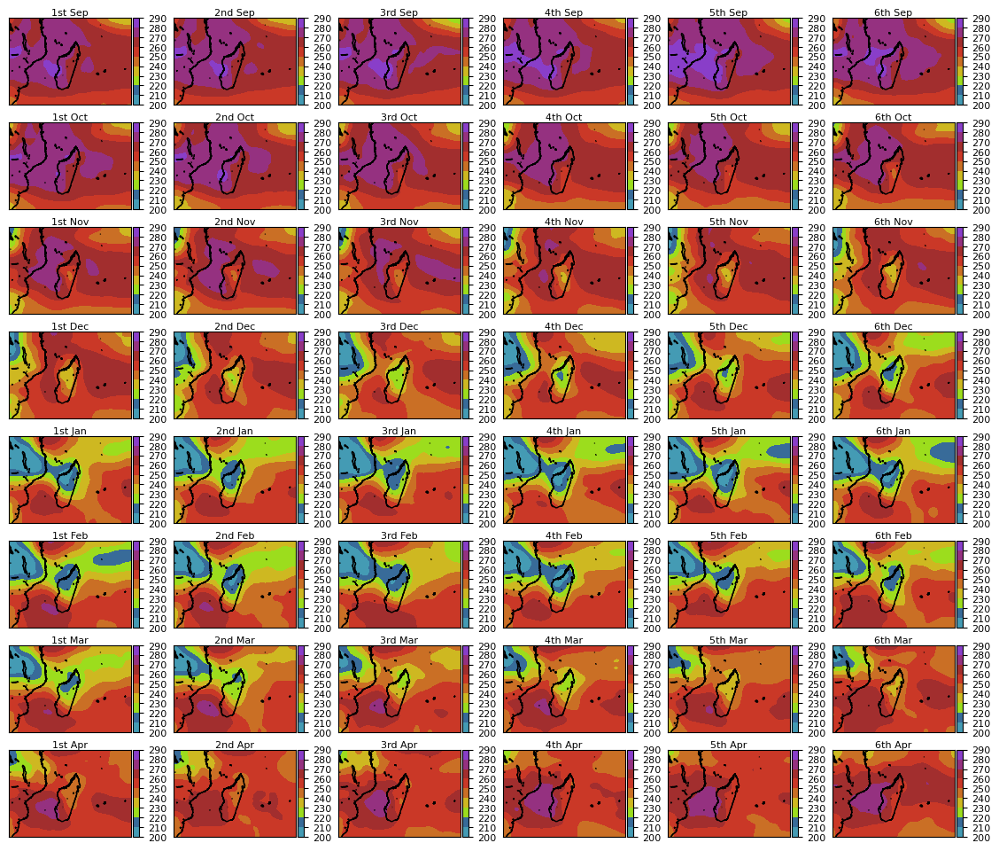

In [128]:
# Import library
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib
from mpl_toolkits.basemap import Basemap
import pandas as pd
import numpy as np

#list_of_filenames = glob.glob("data/clim_*.nc")
list_of_clim = ['data/OLR/clim/clim_49.nc', 'data/OLR/clim/clim_50.nc', 'data/OLR/clim/clim_51.nc', 'data/OLR/clim/clim_52.nc', 'data/OLR/clim/clim_53.nc', 'data/OLR/clim/clim_54.nc',
               'data/OLR/clim/clim_55.nc', 'data/OLR/clim/clim_56.nc', 'data/OLR/clim/clim_57.nc', 'data/OLR/clim/clim_58.nc', 'data/OLR/clim/clim_59.nc', 'data/OLR/clim/clim_60.nc',
               'data/OLR/clim/clim_61.nc', 'data/OLR/clim/clim_62.nc', 'data/OLR/clim/clim_63.nc', 'data/OLR/clim/clim_64.nc', 'data/OLR/clim/clim_65.nc', 'data/OLR/clim/clim_66.nc',
               'data/OLR/clim/clim_67.nc', 'data/OLR/clim/clim_68.nc', 'data/OLR/clim/clim_69.nc', 'data/OLR/clim/clim_70.nc', 'data/OLR/clim/clim_71.nc', 'data/OLR/clim/clim_72.nc',
               'data/OLR/clim/clim_1.nc', 'data/OLR/clim/clim_2.nc', 'data/OLR/clim/clim_3.nc', 'data/OLR/clim/clim_4.nc', 'data/OLR/clim/clim_5.nc', 'data/OLR/clim/clim_6.nc',
               'data/OLR/clim/clim_7.nc', 'data/OLR/clim/clim_8.nc', 'data/OLR/clim/clim_9.nc', 'data/OLR/clim/clim_10.nc', 'data/OLR/clim/clim_11.nc', 'data/OLR/clim/clim_12.nc',
               'data/OLR/clim/clim_13.nc', 'data/OLR/clim/clim_14.nc', 'data/OLR/clim/clim_15.nc', 'data/OLR/clim/clim_16.nc', 'data/OLR/clim/clim_17.nc', 'data/OLR/clim/clim_18.nc',
               'data/OLR/clim/clim_19.nc', 'data/OLR/clim/clim_20.nc', 'data/OLR/clim/clim_21.nc', 'data/OLR/clim/clim_22.nc', 'data/OLR/clim/clim_23.nc', 'data/OLR/clim/clim_24.nc',]
list_of_pentad = ['1st Sep', '2nd Sep', '3rd Sep', '4th Sep', '5th Sep', '6th Sep',
                 '1st Oct', '2nd Oct', '3rd Oct', '4th Oct', '5th Oct', '6th Oct',
                 '1st Nov', '2nd Nov', '3rd Nov', '4th Nov', '5th Nov', '6th Nov',
                 '1st Dec', '2nd Dec', '3rd Dec', '4th Dec', '5th Dec', '6th Dec',
                 '1st Jan', '2nd Jan', '3rd Jan', '4th Jan', '5th Jan', '6th Jan',
                 '1st Feb', '2nd Feb', '3rd Feb', '4th Feb', '5th Feb', '6th Feb',
                 '1st Mar', '2nd Mar', '3rd Mar', '4th Mar', '5th Mar', '6th Mar',
                 '1st Apr', '2nd Apr', '3rd Apr', '4th Apr', '5th Apr', '6th Apr',]
init = xr.open_dataset(r'data/OLR/clim/clim_49.nc') # 1st septembre
init = init.sel(Lat=slice(-30,-5), Lon=slice(30,65))
init = init.olr
lons = init['Lon'][:]
lats = init['Lat'][:]
ls = -1

m = Basemap(projection='cyl', llcrnrlon=min(lons), llcrnrlat=min(lats), urcrnrlon=max(lons), urcrnrlat=max(lats), resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires

fig, ax_list = plt.subplots(8, 6, figsize=(14,12))
for ax, fname in zip(np.ravel(ax_list), list_of_clim):
    ls = ls + 1
    m.ax = ax
    nc = xr.open_dataset(fname)
    nc = nc.sel(Lat=slice(-30,-5), Lon=slice(30,65))
    nc = nc.olr
    cmap = matplotlib.colors.ListedColormap(['#449bb4', '#386b99', '#9cdd1d', '#ceb821', '#ca6f25', '#ca3827', '#a22e2e','#953180','#893ec9'])    
    ticks = [200,210,220,230,240,250,260,270,280,290]
    cc = m.colorbar(p, ticks=ticks)
    ticklabs = cc.ax.get_yticklabels()
    p = m.imshow(nc[:,:], interpolation='spline16', cmap=cmap, vmin=200, vmax=290, label='W/m²')
    cc.ax.set_yticklabels(ticklabs, fontsize=8)
    m.drawcoastlines()
    plt.title( list_of_pentad[ls], fontsize=8, pad=2)
plt.savefig('Pentadal_olr.pdf', format='pdf')
plt.show()

# Start of season (SOS) over central Madagascar

### Climatology of SOS

'''
Criteria: 
    1) 20 mm of rainfall for 2 days with at least 1 rainy day, a daily rainfall means a day with at least 1 mm of rainfall,
    2) No dry spells of 10 days in the next 30 days
'''

<Figure size 800x1500 with 0 Axes>

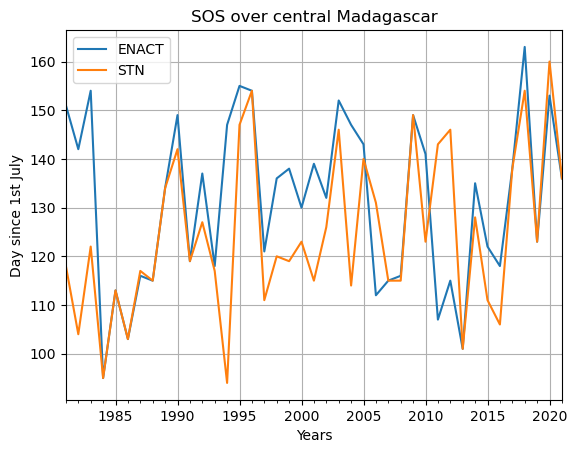

In [3]:
# Criteria of SOS over Madagascar
'''
Criteria: 
    1) 20 mm of rainfall for 2 days with at least 1 rainy day, a daily rainfall means a day with at least 1 mm of rainfall,
    2) No dry spells of 10 days in the next 30 days
'''
# read data onset
sos = pd.read_csv('SOS_ENACT_STN_1981_2021_central_MDG.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-07-01', periods=41, freq='12MS') # We know that this is for SOS data,
sos = sos.drop('dd', axis = 1).set_index('time')
ss = sos.to_xarray()
plt.figure(figsize=(8, 15))
sos.plot()
plt.title('SOS over central Madagascar')
plt.xlabel('Years')
plt.grid()
plt.ylabel('Day since 1st July')
plt.savefig('SOS_over_central_mdg.pdf', format='pdf')
plt.show()

### Correlation between rainfall and SOS

In [4]:
# Import library
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

dd = pd.read_csv('for_correl_SOS_RR.csv', header=0)
dd = dd.drop(['yy'], axis=1)
corr = dd.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None).set_precision(2)

/tmp/ipykernel_18761/2885464425.py:9: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr.style.background_gradient(cmap='coolwarm', axis=None).set_precision(2)


,SOS,Sep,Oct,Nov,Dec,SON,ON,OND
SOS,1.00,-0.17,-0.57,-0.27,0.10,-0.53,-0.51,-0.27
Sep,-0.17,1.00,0.14,0.06,0.04,0.26,0.12,0.12
Oct,-0.57,0.14,1.00,0.19,-0.09,0.68,0.68,0.40
Nov,-0.27,0.06,0.19,1.00,-0.25,0.83,0.85,0.36
Dec,0.10,0.04,-0.09,-0.25,1.00,-0.22,-0.24,0.74
SON,-0.53,0.26,0.68,0.83,-0.22,1.00,0.99,0.48
ON,-0.51,0.12,0.68,0.85,-0.24,0.99,1.00,0.48
OND,-0.27,0.12,0.40,0.36,0.74,0.48,0.48,1.00


### Predictability of SOS , Correlation maps

In [1]:
# Correlation between SOS and predictors
# Script for correlation process are from https://github.com/royalosyin/Python-Practical-Application-on-Climate-Variability-Studies/blob/master/ex34-Correlations%20between%20SOI%20and%20SLP%2C%20Temperature%20and%20Precipitation.ipynb

import numpy as np
import xarray as xr
import pandas as pd
from numba import jit
from functools import partial
from scipy.stats import pearsonr

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

import warnings
warnings.filterwarnings('ignore')

def pr_cor_corr(x, y):
    """
    Uses the scipy stats module to calculate a pearson correlation test
    :x vector: Input pixel vector to run tests on
    :y vector: The date input vector 
    """
    # Check NA values
    co = np.count_nonzero(~np.isnan(x))
    if co < len(y): # If fewer than length of y observations return np.nan
        return np.nan, np.nan   
    
    corr, _ = pearsonr(x, y)
    return corr

def pr_cor_pval(x, y):
    """
    Uses the scipy stats module to calculate a pearson correlation test
    :x vector: Input pixel vector to run tests on
    :y vector: The date input vector 
    """
    # Check NA values
    co = np.count_nonzero(~np.isnan(x))
    if co < len(y): # If fewer than length of y observations return np.nan
        return np.nan
    # Run the pearson correlation test
    _, p_value = pearsonr(x, y)
    return p_value   

# The function we are going to use for applying our pearson test per pixel
def pearsonr_corr(x, y, func=pr_cor_corr, dim='time'):
    # x = Pixel value, y = a vector containing the date, dim == dimension
    return xr.apply_ufunc(
        func, x , y,
        input_core_dims=[[dim], [dim]],        
        vectorize=True,   
        output_dtypes=[float]
    )


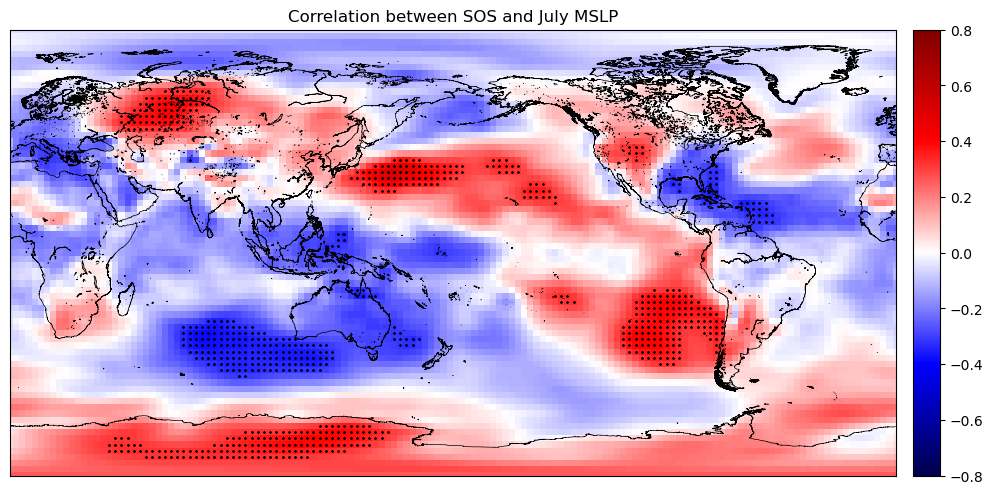

In [38]:
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-07-01', periods=41, freq='12MS') # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/pres.sfc.mon.mean.nc')
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([7])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.pres.stack(point=('lat', 'lon')).groupby('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')

# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.lon, sst_corr.lat)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.lon, sst_corr.lat, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and July MSLP')
plt.savefig('Correlation between SOS and July MSLP.pdf', format='pdf')
plt.show()

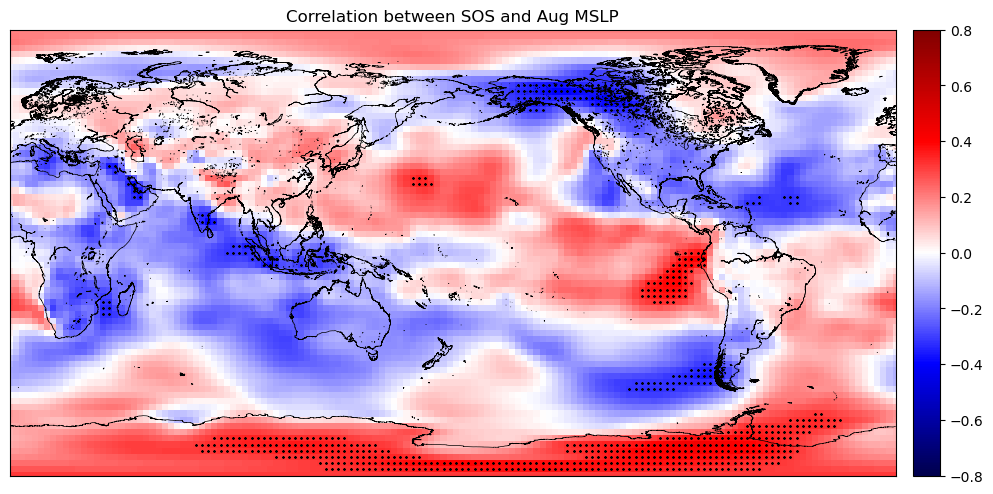

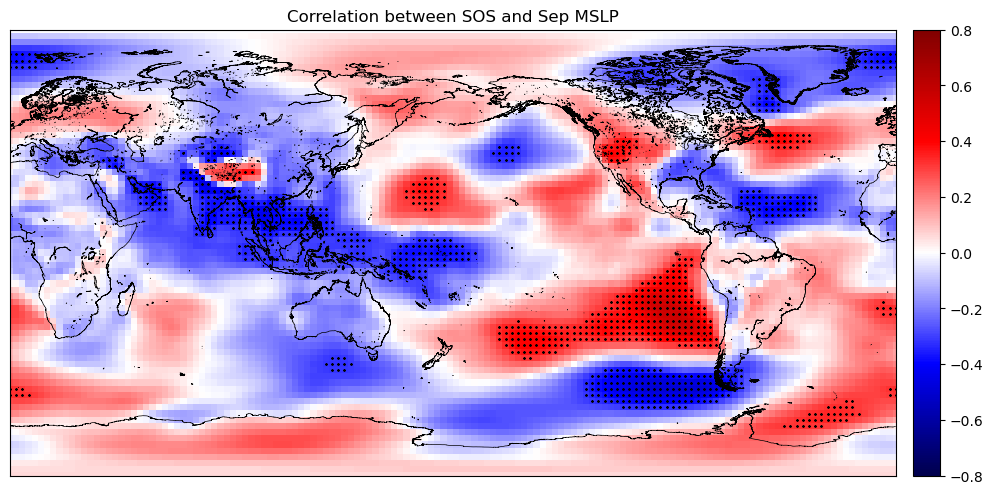

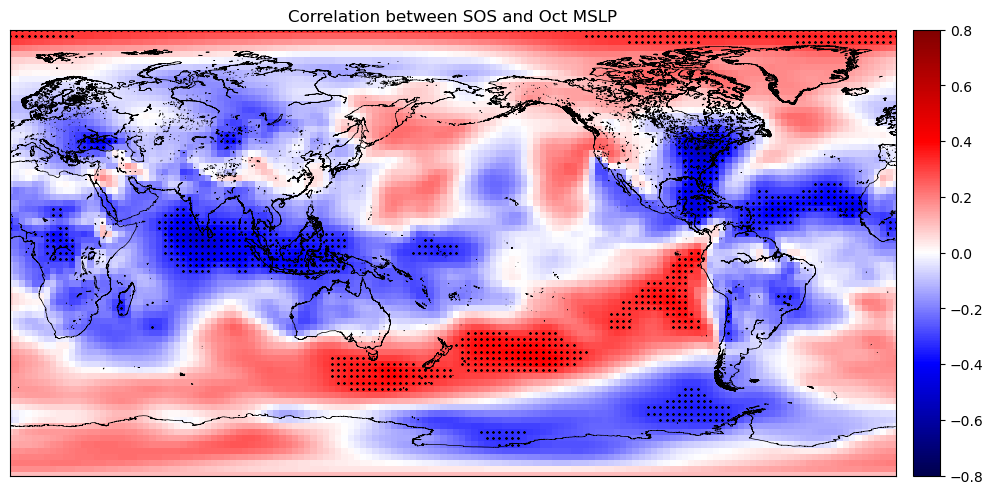

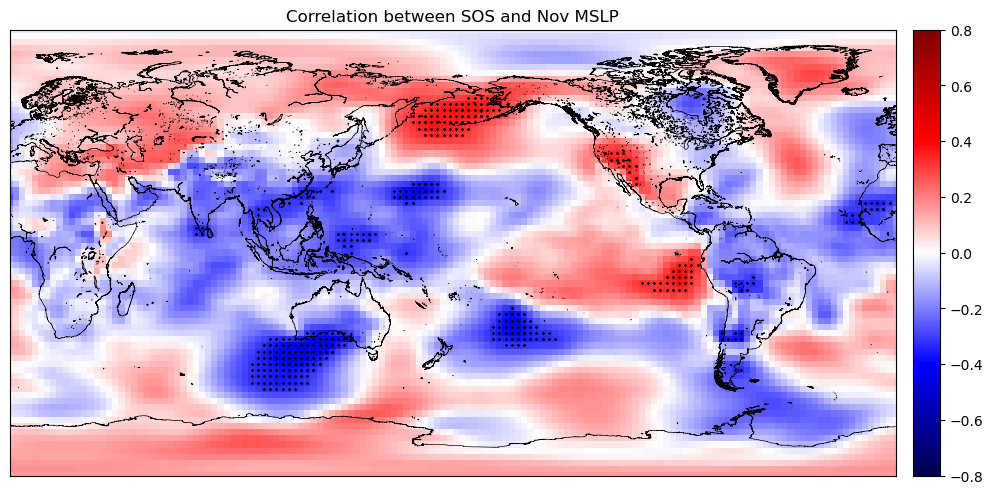

#### Correlation with SST

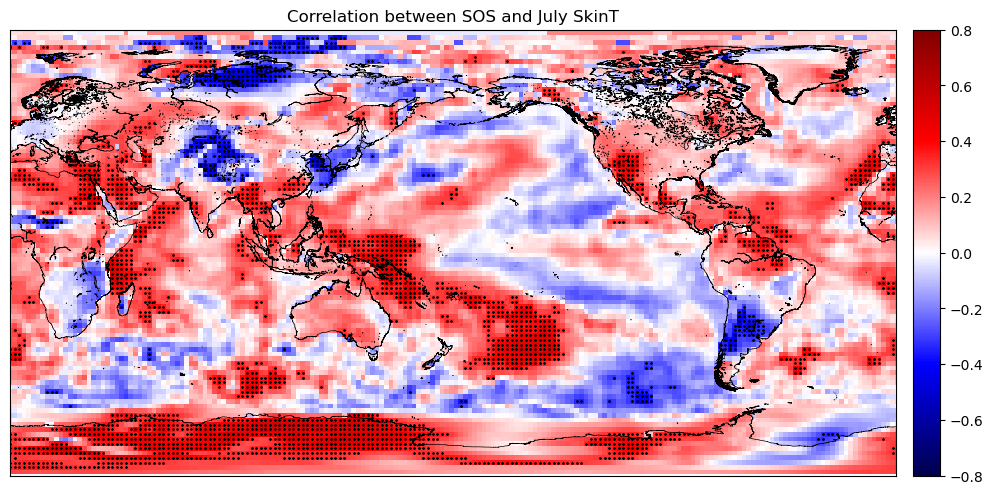

In [43]:
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-07-01', periods=41, freq='12MS') # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/skt.sfc.mon.mean.nc')
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([7])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.skt.stack(point=('lat', 'lon')).groupby('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')

# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.lon, sst_corr.lat)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.lon, sst_corr.lat, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and July SkinT')
plt.savefig('Correlation between SOS and July SkinT.pdf', format='pdf')
plt.show()

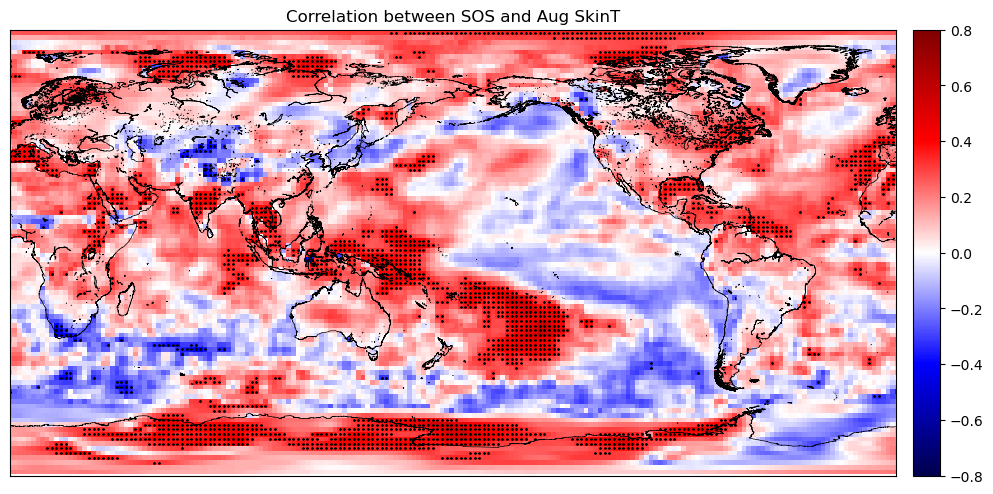

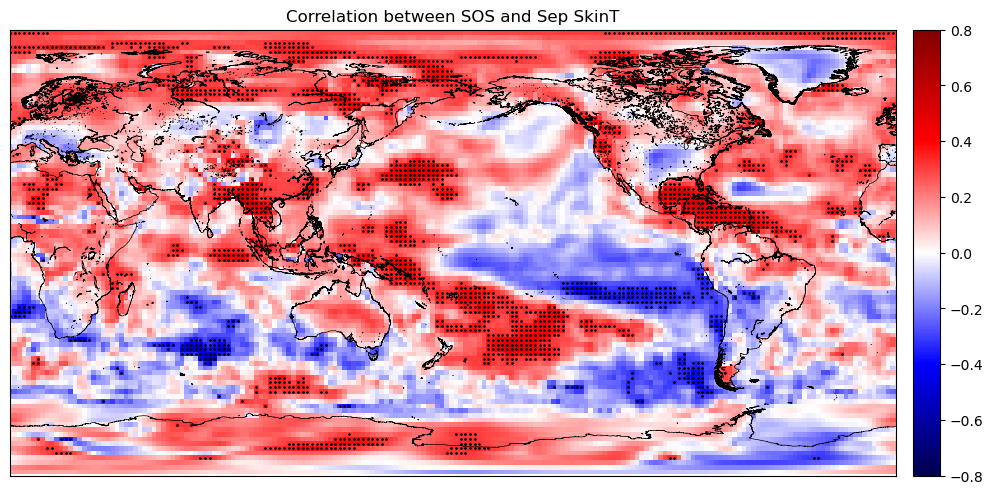

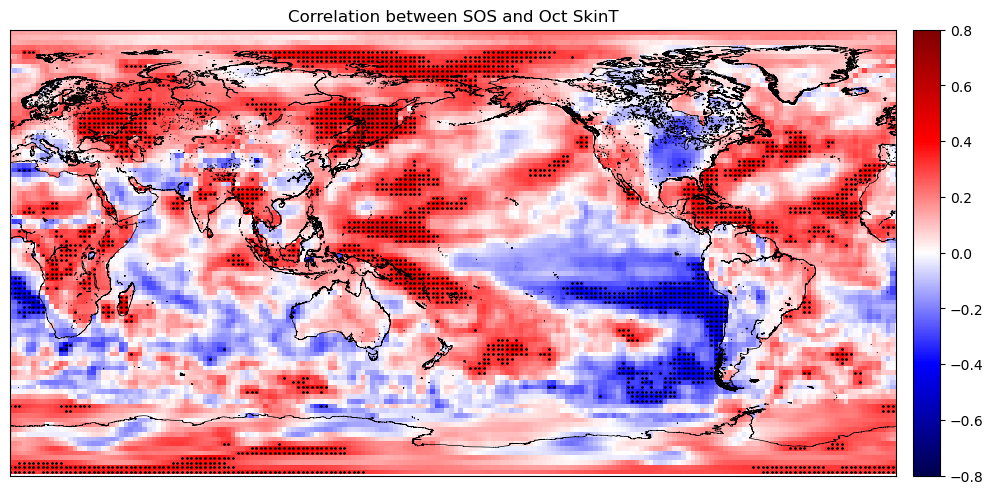

#### Correlation with U and V wind conmponent on 850hpa

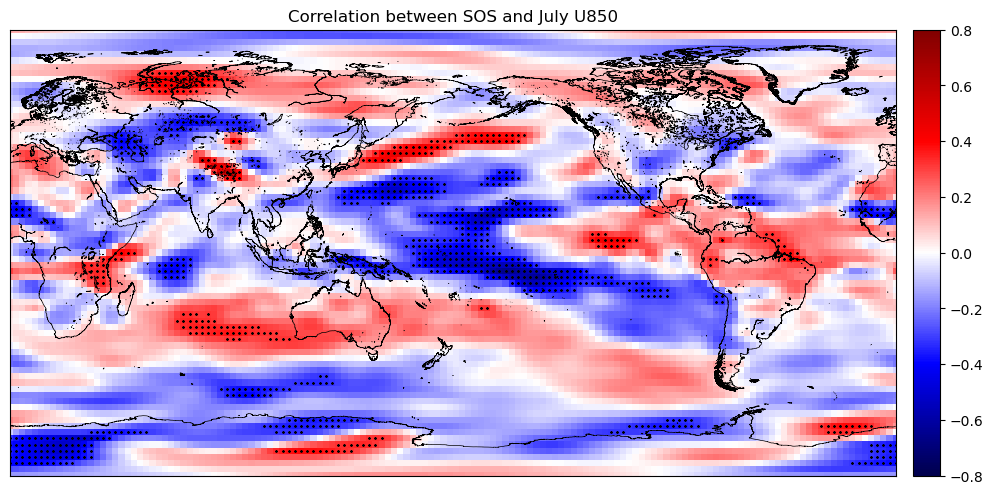

In [47]:
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-07-01', periods=41, freq='12MS') # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/uwnd850.mon.mean.nc')
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([7])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.uwnd.stack(point=('lat', 'lon')).groupby('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')

# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.lon, sst_corr.lat)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.lon, sst_corr.lat, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and July U850')
plt.savefig('Correlation between SOS and July U850.pdf', format='pdf')
plt.show()

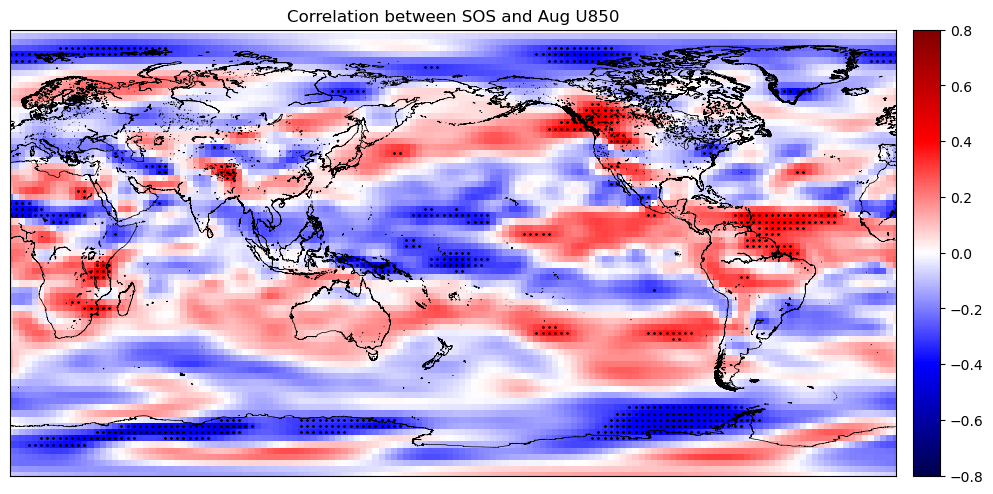

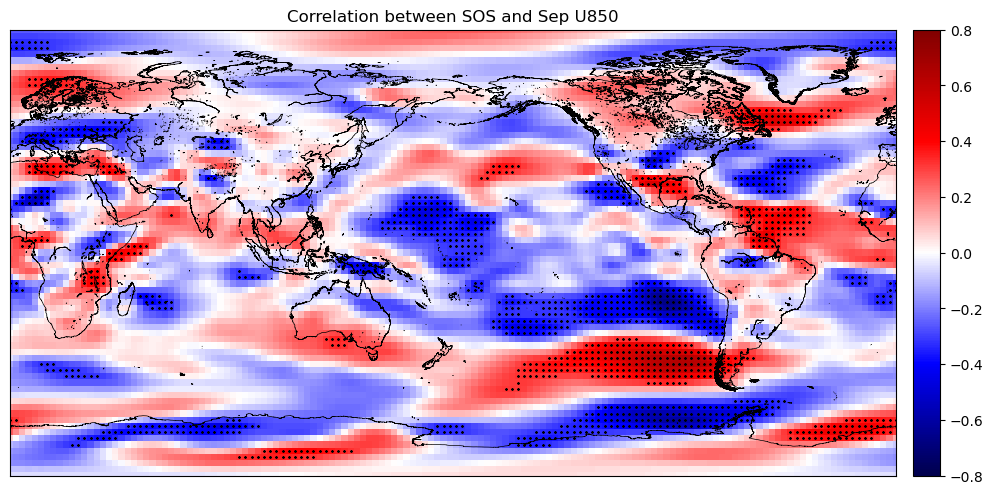

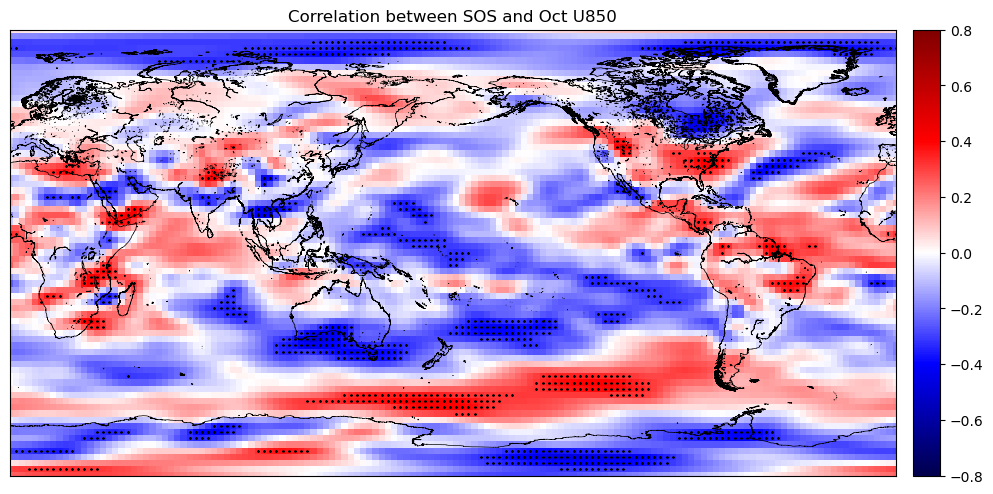

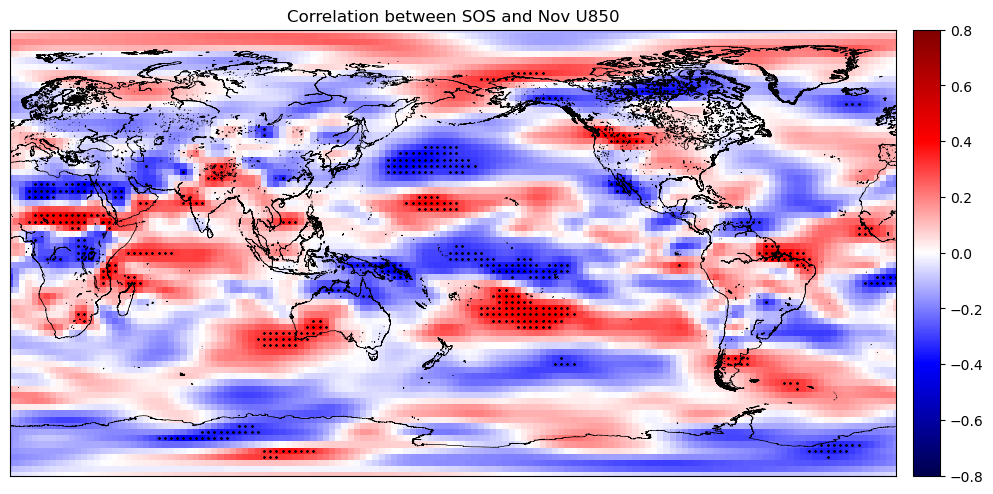

#### V wind component 850hpa

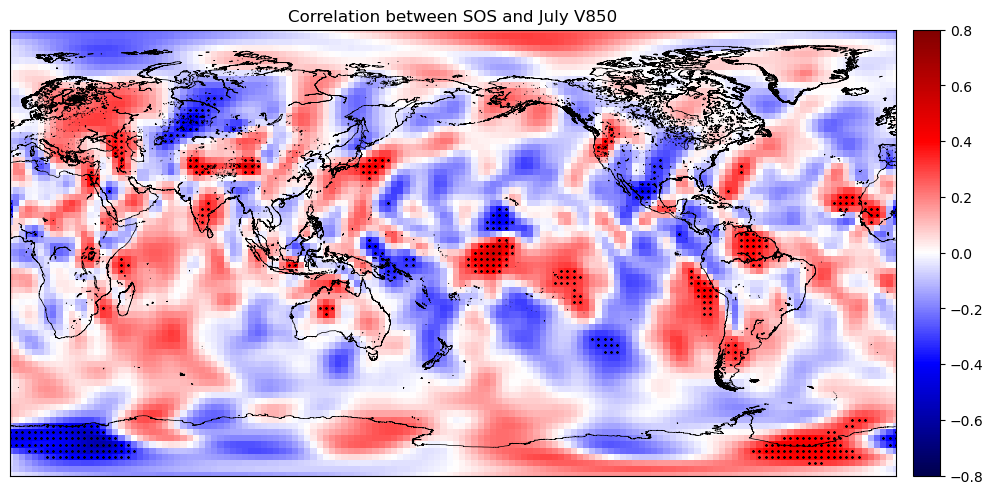

In [52]:
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-07-01', periods=41, freq='12MS') # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/vwnd850.mon.mean.nc')
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([7])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.vwnd.stack(point=('lat', 'lon')).groupby('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')

# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.lon, sst_corr.lat)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.lon, sst_corr.lat, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and July V850')
plt.savefig('Correlation between SOS and July V850.pdf', format='pdf')
plt.show()

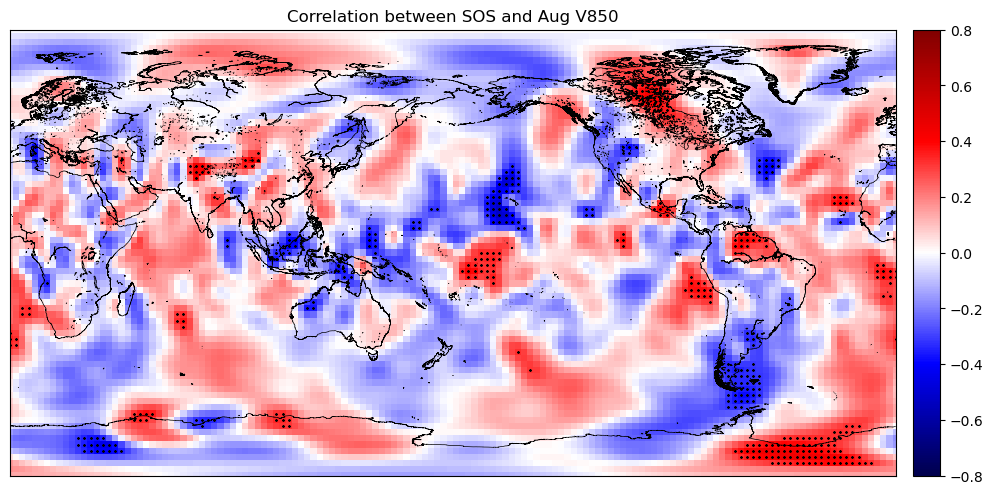

Text(0.5, 1.0, 'Correlation between SOS and Sep V850')

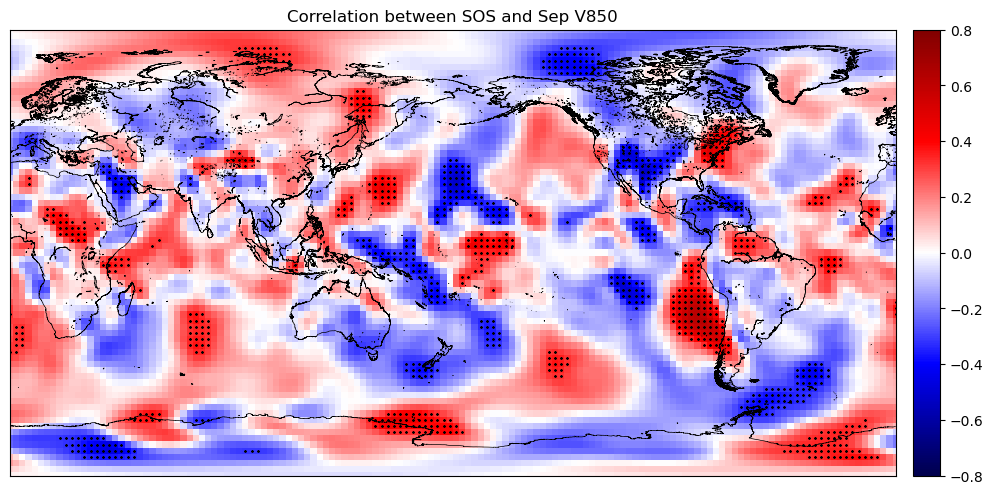

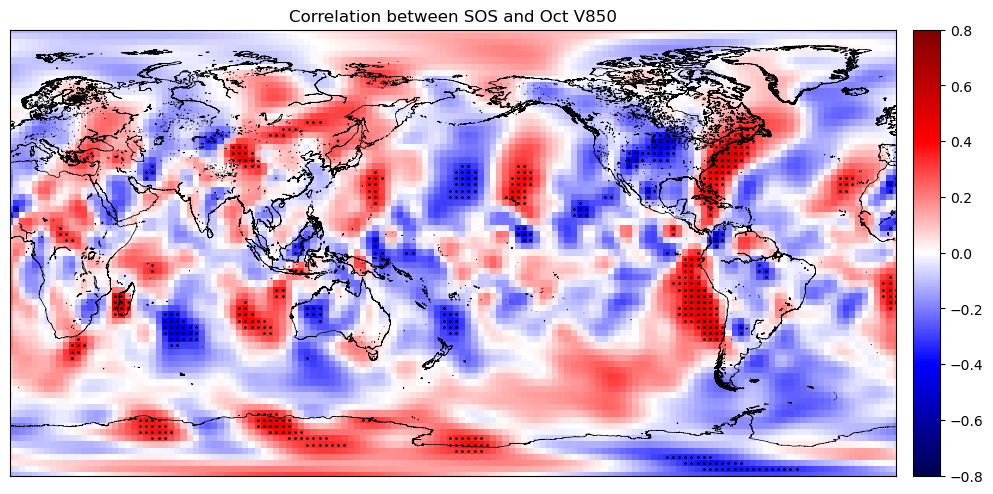

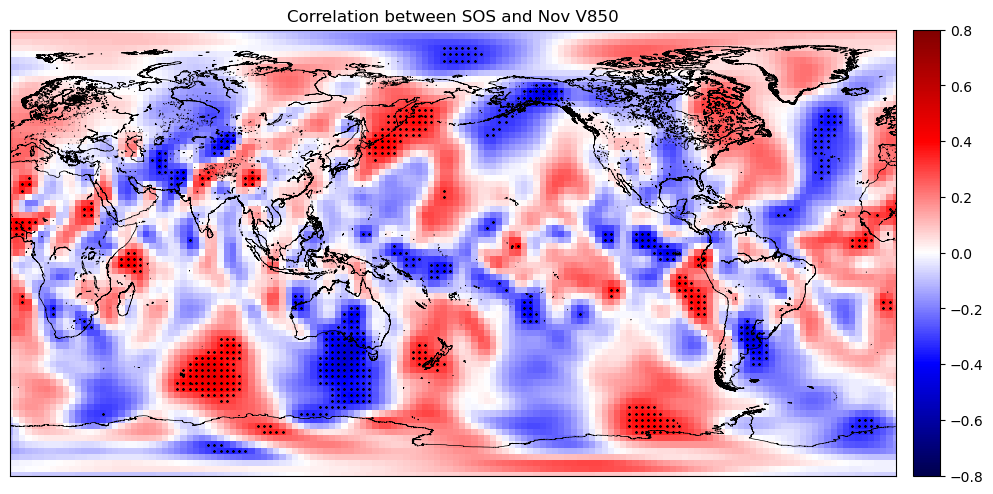

### Correlation RR ON and Predictors

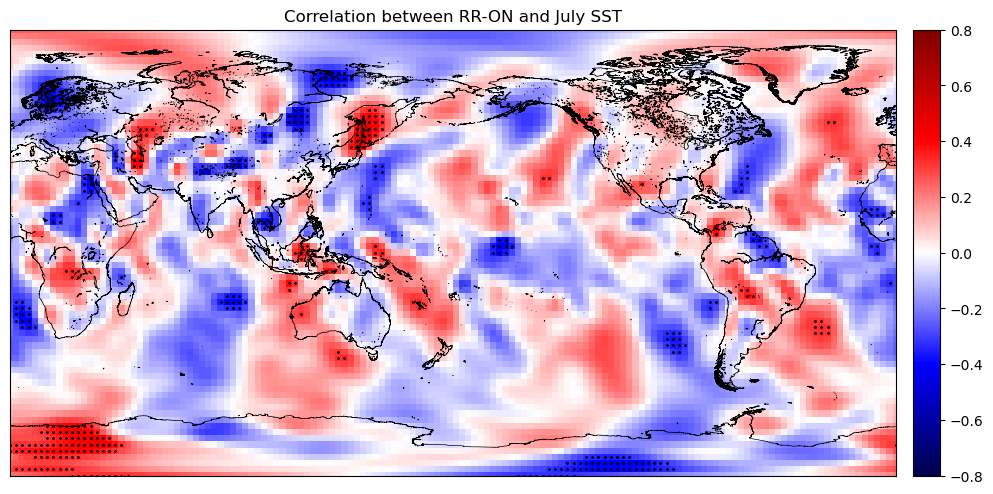

In [24]:
# V850
sos = pd.read_csv('for_correl_SOS_RR.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-07-01', periods=41, freq='12MS') #+ pd.DateOffset(days=15) # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
sos = sos.drop('yy', axis = 1).set_index('time')
#sos = sos.set_index('time')
#sos = sos.ON
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/vwnd850.mon.mean.nc')
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([7])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.vwnd.stack(point=('lat', 'lon')).groupby('point')
sst_pval = pearsonr_corr(ds_pres, ss.ON, func= pr_cor_pval).unstack('point')
sst_corr = pearsonr_corr(ds_pres, ss.ON).unstack('point')

# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.lon, sst_corr.lat)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.lon, sst_corr.lat, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between RR-ON and July SST')
plt.savefig('Correlation between RR-ON and July SST.pdf', format='pdf')
plt.show()


In [25]:
da_slp2

<xarray.Dataset>
Dimensions:  (lat: 73, lon: 144, time: 40)
Coordinates:
  * lat      (lat) float32 90.0 87.5 85.0 82.5 80.0 ... -82.5 -85.0 -87.5 -90.0
  * lon      (lon) float32 0.0 2.5 5.0 7.5 10.0 ... 350.0 352.5 355.0 357.5
  * time     (time) datetime64[ns] 1981-07-01 1982-07-01 ... 2020-07-01
Data variables:
    vwnd     (time, lat, lon) float32 -0.6798 -0.8298 -0.9798 ... -8.007 -8.131
Attributes:
    CDI:            Climate Data Interface version 2.0.4 (https://mpimet.mpg....
    Conventions:    COARDS
    title:          monthly mean v wind from the NCEP Reanalysis
    description:    Data from NCEP initialized reanalysis (4x/day).  These ar...
    platform:       Model
    NCO:            netCDF Operators version 5.0.6 (Homepage = http://nco.sf....
    history:        Mon May 22 13:16:10 2023: ncpdq vwnd.mon.850_2.nc vwnd850...
    dataset_title:  NCEP-NCAR Reanalysis 1
    References:     http://www.psl.noaa.gov/data/gridded/data.ncep.reanalysis...
    CDO:            Climate Data Operators version 2.0.4 (https://mpimet.mpg....

### For correlation with SST

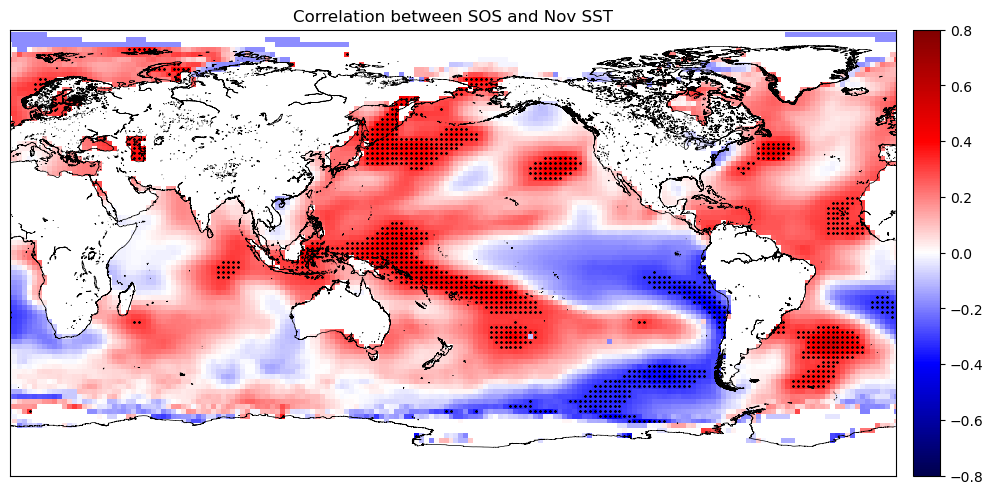

In [35]:
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-11-01', periods=41, freq='12MS')#+ pd.DateOffset(days=15) # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/sst4.nc', decode_times=False)
da_slp['time'] = pd.date_range(start='1981-01-01', periods=da_slp.sizes['time'], freq='MS') #We know that our data start from 1981-01-01
#print(nc)
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([11])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.sst.stack(point=('Latitude', 'Longitude')).groupby('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')


# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.Longitude, sst_corr.Latitude)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.Longitude, sst_corr.Latitude, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and Nov SST')
plt.savefig('Correlation between SOS and Nov SST.pdf', format='pdf')
plt.show()


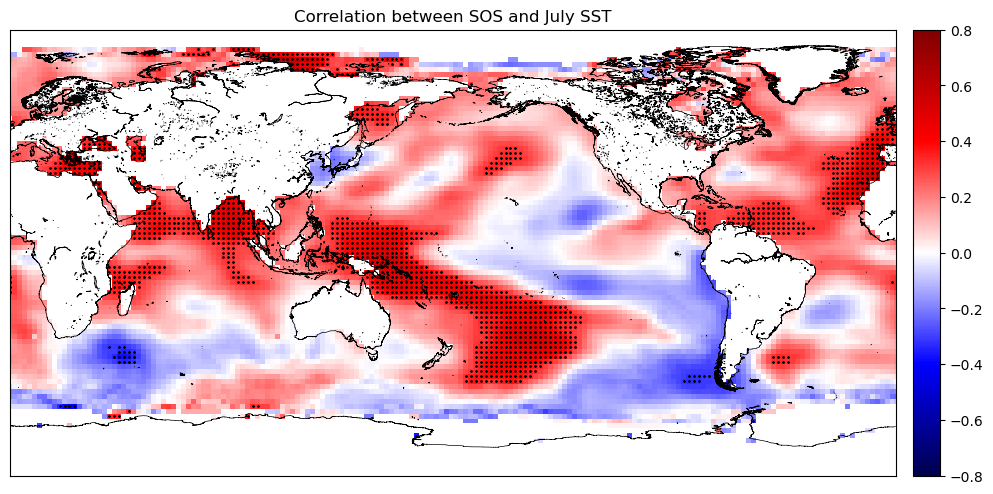

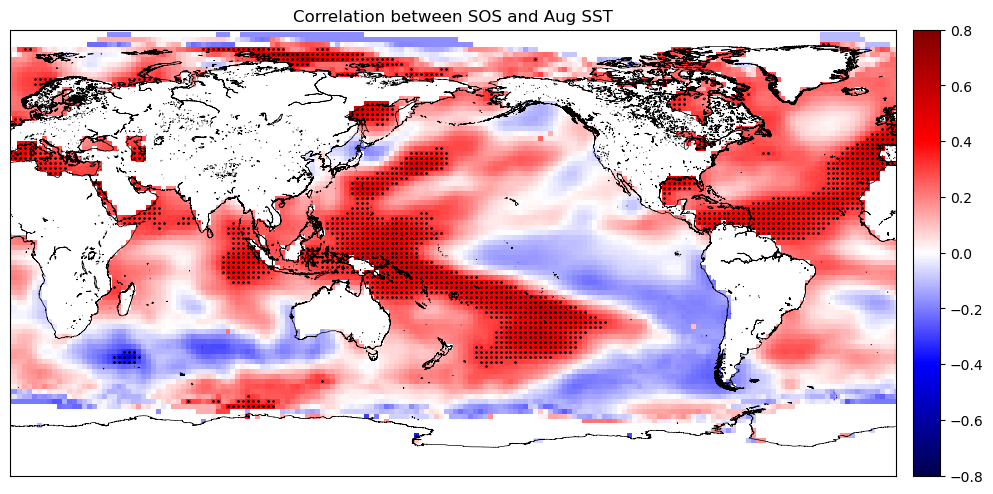

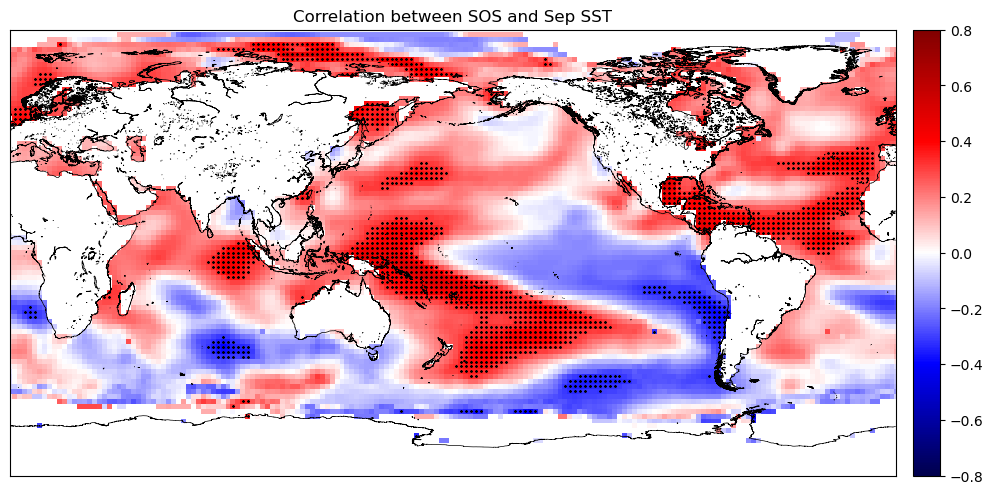

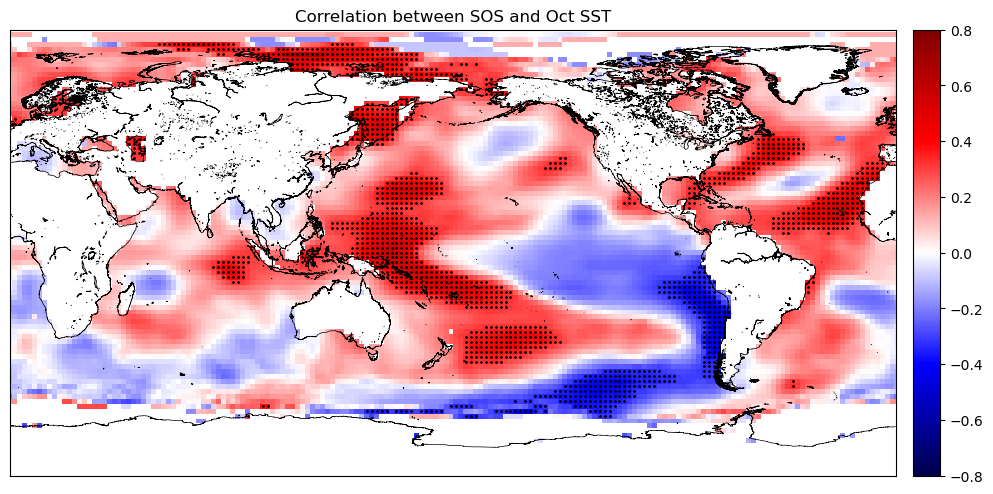

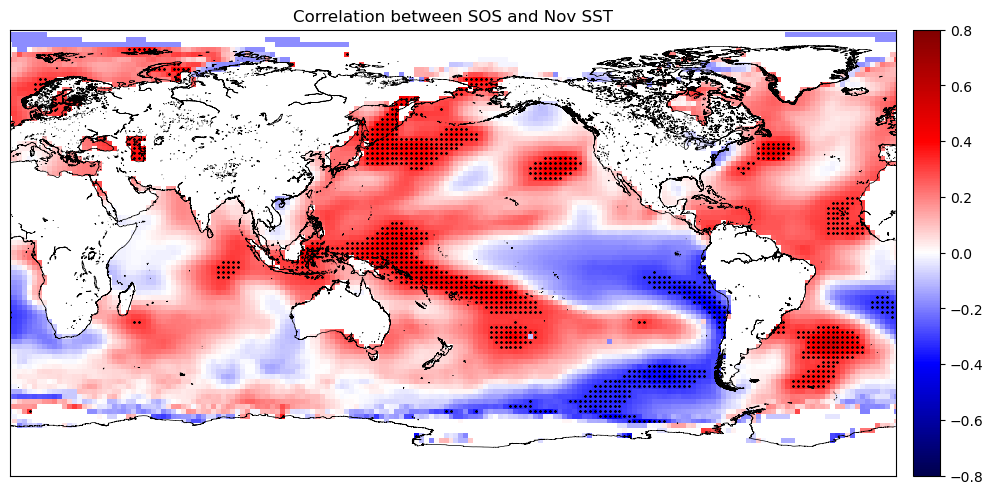

In [37]:
# For SST
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-07-01', periods=41, freq='12MS')#+ pd.DateOffset(days=15) # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/sst4.nc', decode_times=False)
da_slp['time'] = pd.date_range(start='1981-01-01', periods=da_slp.sizes['time'], freq='MS') #We know that our data start from 1981-01-01
#print(nc)
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([7])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.sst.stack(point=('Latitude', 'Longitude')).groupby('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')


# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.Longitude, sst_corr.Latitude)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.Longitude, sst_corr.Latitude, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and July SST')
plt.savefig('Correlation between SOS and July SST.pdf', format='pdf')
plt.show()
#######################
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-08-01', periods=41, freq='12MS')#+ pd.DateOffset(days=15) # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/sst4.nc', decode_times=False)
da_slp['time'] = pd.date_range(start='1981-01-01', periods=da_slp.sizes['time'], freq='MS') #We know that our data start from 1981-01-01
#print(nc)
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([8])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.sst.stack(point=('Latitude', 'Longitude')).groupby('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')


# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.Longitude, sst_corr.Latitude)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.Longitude, sst_corr.Latitude, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and Aug SST')
plt.savefig('Correlation between SOS and Aug SST.pdf', format='pdf')
plt.show()
################################
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-09-01', periods=41, freq='12MS')#+ pd.DateOffset(days=15) # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/sst4.nc', decode_times=False)
da_slp['time'] = pd.date_range(start='1981-01-01', periods=da_slp.sizes['time'], freq='MS') #We know that our data start from 1981-01-01
#print(nc)
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([9])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.sst.stack(point=('Latitude', 'Longitude')).groupby('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')


# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.Longitude, sst_corr.Latitude)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.Longitude, sst_corr.Latitude, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and Sep SST')
plt.savefig('Correlation between SOS and Sep SST.pdf', format='pdf')
plt.show()
##########################
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-10-01', periods=41, freq='12MS')#+ pd.DateOffset(days=15) # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/sst4.nc', decode_times=False)
da_slp['time'] = pd.date_range(start='1981-01-01', periods=da_slp.sizes['time'], freq='MS') #We know that our data start from 1981-01-01
#print(nc)
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([10])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.sst.stack(point=('Latitude', 'Longitude')).groupby('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')


# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.Longitude, sst_corr.Latitude)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.Longitude, sst_corr.Latitude, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and Oct SST')
plt.savefig('Correlation between SOS and Oct SST.pdf', format='pdf')
plt.show()
#############################################
# read data onset
sos = pd.read_csv('SOS_1981_2021_STN.csv', header=0) # SOS for 41 years over average station over central Mdg
sos['time'] = pd.date_range('1981-11-01', periods=41, freq='12MS')#+ pd.DateOffset(days=15) # We know that this is for SOS data, we need to fixe for the same time as the oredictors for correlation for lag-0
#sos = sos.drop('dd', axis = 1).set_index('time')
sos = sos.set_index('time')
ss = sos.to_xarray()

# Read predictor nc data
da_slp = xr.open_dataset(r'data/sst4.nc', decode_times=False)
da_slp['time'] = pd.date_range(start='1981-01-01', periods=da_slp.sizes['time'], freq='MS') #We know that our data start from 1981-01-01
#print(nc)
da_july = da_slp.sel(time=da_slp.time.dt.month.isin([11])) # Select only montlhy data, here only for July

# We need same time step
ss = ss.sel(time=slice('1981', '2020'))
da_slp2 = da_july.sel(time=slice('1981', '2020'))

# Calculate correlation 
ds_pres = da_slp2.sst.stack(point=('Latitude', 'Longitude')).groupby('point')
sst_corr = pearsonr_corr(ds_pres, ss.STN).unstack('point')
sst_pval = pearsonr_corr(ds_pres, ss.STN, func= pr_cor_pval).unstack('point')


# Plot correlation maps with significant p-value

plt.figure(figsize=(12, 9))
lons, lats = np.meshgrid(sst_corr.Longitude, sst_corr.Latitude)
m = Basemap(projection='cyl', llcrnrlon=0, llcrnrlat=-90, urcrnrlon=357.5, urcrnrlat=90, resolution='h') #resolution='h' for hires, need to install conda install -c conda-forge basemap-data-hires
pl = m.pcolormesh(sst_corr.Longitude, sst_corr.Latitude, sst_corr, cmap='seismic', latlon=True, vmin=-0.8, vmax=0.8)
m.colorbar(pl,"right", size="3%", pad='2%')
sig_area   = np.where(sst_pval < 0.05) # We can xhoose another pvalue score
m.scatter(lons[sig_area], lats[sig_area], marker = '*', s = 1 , c = 'k', alpha = 1)
m.drawcoastlines(linewidth = 0.5)
plt.title('Correlation between SOS and Nov SST')
plt.savefig('Correlation between SOS and Nov SST.pdf', format='pdf')
plt.show()


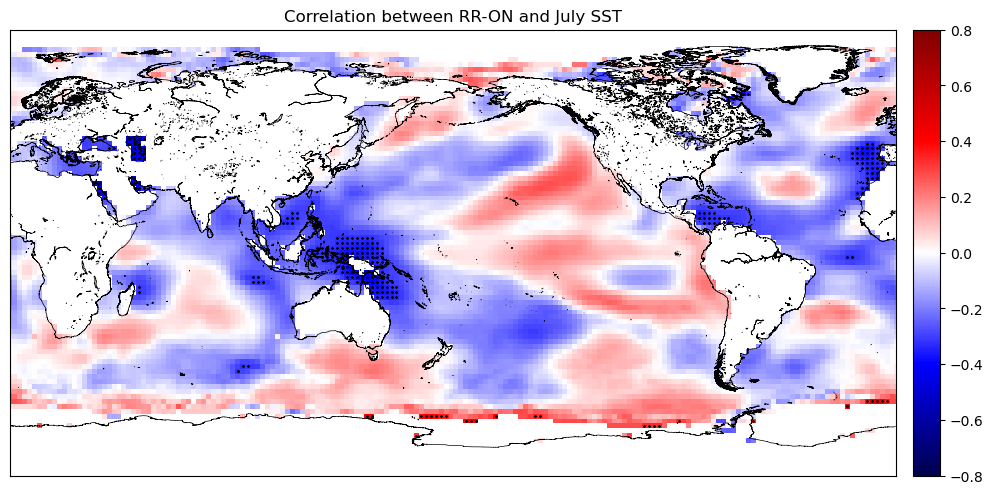

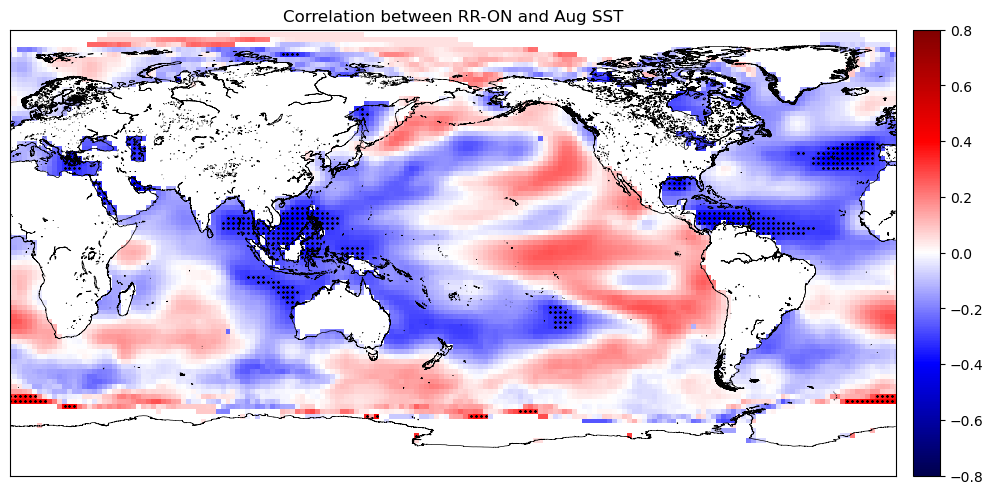

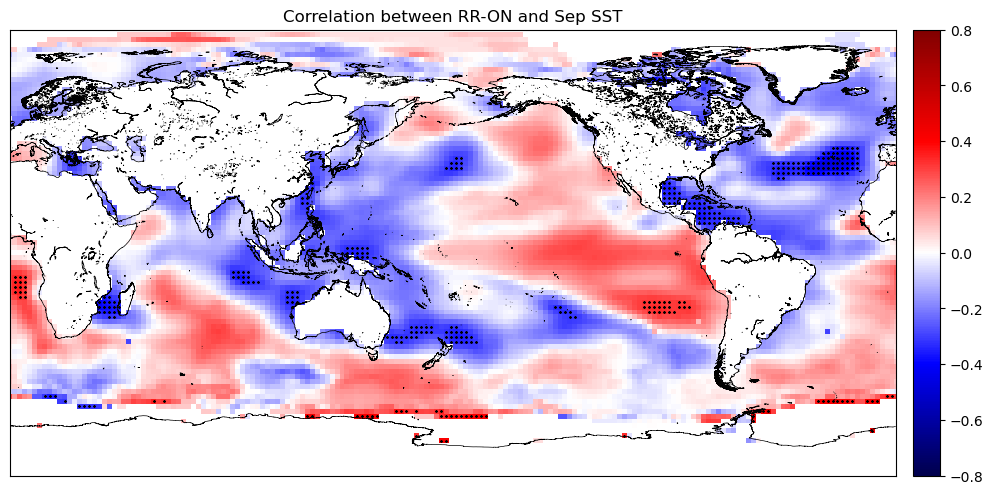

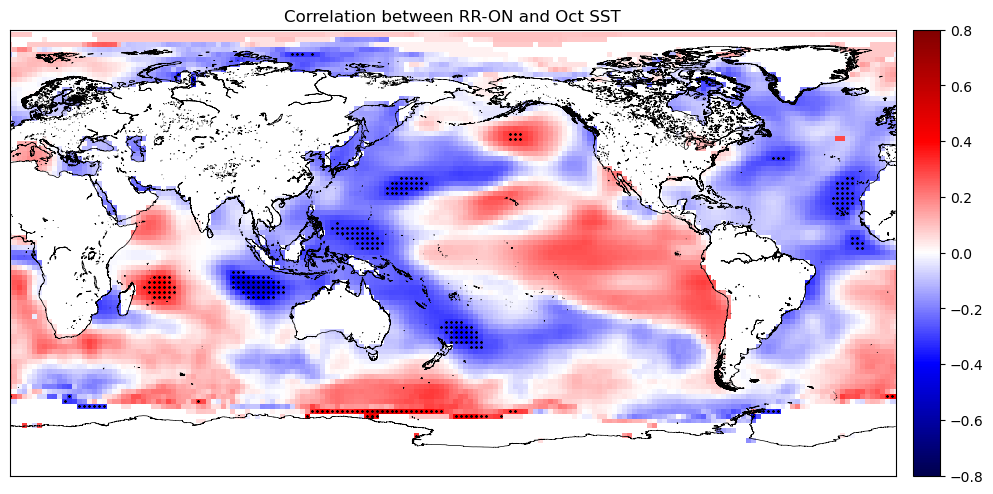

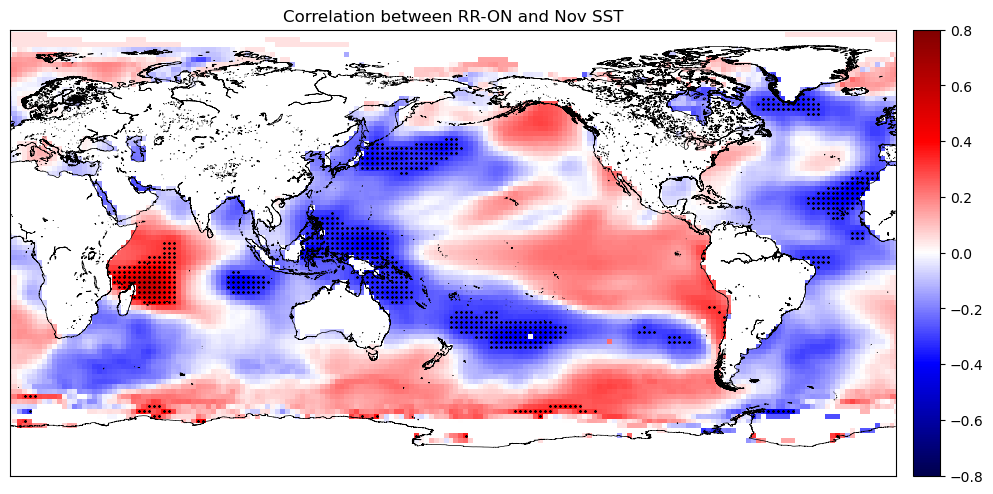

In [38]:
# Correlation between RR-ON and SST